<a href="https://colab.research.google.com/github/oshmita26/PaddleOCR/blob/release%2F2.6/ppocr_model_rembg.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install paddlepaddle
!pip install "paddleocr>=2.0.6"

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.6/121.6 MB 7.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 385.5/385.5 KB 25.7 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 440.6/440.6 KB 2.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 148.4/148.4 KB 15.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 73.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 965.4/965.4 KB 51.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.3/88.3 KB 9.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 72.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.8/8.8 MB 78.9 MB/s eta 0:00:0

In [2]:
!git clone https://github.com/PaddlePaddle/PaddleOCR

Cloning into 'PaddleOCR'...
remote: Enumerating objects: 45232, done.
remote: Counting objects: 100% (39/39), done.
remote: Compressing objects: 100% (30/30), done.
remote: Total 45232 (delta 15), reused 23 (delta 9), pack-reused 45193
Receiving objects: 100% (45232/45232), 338.35 MiB | 32.73 MiB/s, done.
Resolving deltas: 100% (31906/31906), done.
Checking out files: 100% (1620/1620), done.


In [3]:
!pip install validators

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Preparing metadata (setup.py) ... done
  Created wheel for validators: filename=validators-0.20.0-py3-none-any.whl size=19581 sha256=3dd5a4995ade5504a2ebcf52dda102cf861748d7dc702d6f87f31dc392190fc1
  Stored in directory: /root/.cache/pip/wheels/19/09/72/3eb74d236bb48bd0f3c6c3c83e4e0c5bbfcbcad7c6c3539db8
Successfully built validators


In [4]:
import cv2 
from google.colab.patches import cv2_imshow
import os
import matplotlib.pyplot as plt
%matplotlib inline
from paddleocr import PaddleOCR, draw_ocr
from PIL import Image
# import the necessary packages
from imutils.contours import sort_contours
import numpy as np
import argparse
import imutils
import sys
import os
import urllib
import pandas as pd
import timeit
import validators

In [5]:
def extract_mrz_(input_file):
  image = None
  if validators.url(input_file):
    url_response = urllib.request.urlopen(input_file)
    arr = np.asarray(bytearray(url_response.read()), dtype=np.uint8)
    image = cv2.imdecode(arr, -1)
  else:
    image = cv2.imread(input_file)
  image = cv2.resize(image, (1000, 450))
  gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
  (H, W) = gray.shape

  # initialize a rectangular and square structuring kernel
  rectKernel = cv2.getStructuringElement(cv2.MORPH_RECT, (25, 7))
  sqKernel = cv2.getStructuringElement(cv2.MORPH_RECT, (25, 25))
  # smooth the image using a 3x3 Gaussian blur and then apply a
  # blackhat morpholigical operator to find dark regions on a light
  # background
  gray = cv2.GaussianBlur(gray, (3, 3), 0)
  # cv2_imshow(gray)

  blackhat = cv2.morphologyEx(gray, cv2.MORPH_BLACKHAT, rectKernel)
  # cv2_imshow(blackhat)

  # compute the Scharr gradient of the blackhat image and scale the
  # result into the range [0, 255]
  grad = cv2.Sobel(blackhat, ddepth=cv2.CV_32F, dx=1, dy=0, ksize=-1)
  grad = np.absolute(grad)
  (minVal, maxVal) = (np.min(grad), np.max(grad))
  grad = (grad - minVal) / (maxVal - minVal)
  grad = (grad * 255).astype("uint8")
  # cv2_imshow(grad)
  # apply a closing operation using the rectangular kernel to close
  # gaps in between letters -- then apply Otsu's thresholding method
  #grad = blackhat
  grad = cv2.morphologyEx(grad, cv2.MORPH_CLOSE, rectKernel)
  thresh = cv2.threshold(grad, 0, 255,
                        cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]
  # cv2_imshow(thresh)
  # perform another closing operation, this time using the square
  # kernel to close gaps between lines of the MRZ, then perform a
  # series of erosions to break apart connected components
  thresh = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, sqKernel)
  thresh = cv2.erode(thresh, None, iterations=2)
  # cv2_imshow(thresh)
  ##################
  # contours, hierarchy = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
  # contour_image = np.zeros_like(image)
  # cv2.drawContours(contour_image, contours, -1, 255, 2)
  # cv2_imshow(contour_image)
  ##################
  cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL,
                        cv2.CHAIN_APPROX_SIMPLE)
  cnts = imutils.grab_contours(cnts)
  cnts = sort_contours(cnts, method="bottom-to-top")[0]
  # initialize the bounding box associated with the MRZ
  mrzBox = None

  # loop over the contours
  for c in cnts:
      # compute the bounding box of the contour and then derive the
      # how much of the image the bounding box occupies in terms of
      # both width and height
      (x, y, w, h) = cv2.boundingRect(c)
      #print(x, y, w, h)
      percentWidth = w / float(W)
      percentHeight = h / float(H)
      # if the bounding box occupies > 80% width and > 4% height of the
      # image, then assume we have found the MRZ
      if percentWidth > 0.6 and percentHeight > 0.04:
          mrzBox = (x, y, w, h)
          #print("yes")
          break

  # if the MRZ was not found, exit the script
  if mrzBox is None:
    # print("[INFO] MRZ could not be found")
    return None
  # pad the bounding box since we applied erosions and now need to
  # re-grow it
  (x, y, w, h) = mrzBox
  pX = int((x + w) * 0.03)
  pY = int((y + h) * 0.03)
  (x, y) = (x - pX, y - pY)
  (w, h) = (w + (pX * 2), h + (pY * 2))
  # extract the padded MRZ from the image
  mrz = image[y:y + h, x:x + w]
  # print(h/w)
  # cv2_imshow(mrz)
  card = gray[0:y,x-pX:x+w]
  try:
    cv2.imwrite("temp.jpg", mrz)
  except:
    return None

  return mrz, "temp.jpg"

In [6]:
def split_image(image_file):
  image = cv2.imread(image_file)
  h, w, channels = image.shape
  one_third = h//3
  top = image[:one_third, :]
  middle = image[one_third:2*one_third, :]
  bottom = image[2*one_third:, :]
  cv2.imwrite("top.jpg", top)
  cv2.imwrite("middle.jpg", middle)
  cv2.imwrite("bottom.jpg", bottom)

  return "top.jpg", "middle.jpg", "bottom.jpg"

In [7]:
def read_mrz_top(mrz_img_file):
  mrzList = get_ppocr_model(mrz_img_file)
  mrzText = ' '.join(str(elem) for elem in mrzList)
  #mrz postprocessing
  mrzText = mrzText.replace (' ', '')
  mrzText = mrzText.replace ('<<', '#')
  mrzText = mrzText.replace ('<', '#')
  mrzText=mrzText.replace ('\n', '#')

  # print(mrzText)
  x = filter(None,mrzText.split("#"))

  mrz_list = list(x)

  mrzdict = {
      #"Image": image_file ,
      "ID card": mrz_list[0][5:14],
  }

  return mrzdict

In [8]:
def read_mrz_middle(mrz_img_file):
  mrzList = get_ppocr_model(mrz_img_file)
  mrzText = ' '.join(str(elem) for elem in mrzList)
  #mrz postprocessing
  mrzText = mrzText.replace (' ', '')

  print(mrzText)
  mrzText = mrzText.replace ('<<', '#')
  mrzText = mrzText.replace ('<', '#')
  #print(mrzText)
  mrzText=mrzText.replace ('\n', '#')

  # print(mrzText)
  x = filter(None,mrzText.split("#"))

  mrz_list = list(x)
  print(mrz_list)

  mrz_list_0 = mrz_list[0]
  mrz_list[0] = mrz_list_0[1:len(mrz_list_0)-1]

  mrzdict = {
      "Sex": mrz_list_0[7],
      "DoE": mrz_list_0[8:14],
      "DOB": mrz_list_0[:6],
      "Country": mrz_list_0[15:18],
  }
  return mrzdict

In [9]:
def read_mrz_bottom(mrz_img_file):
  mrzList = get_ppocr_model(mrz_img_file)
  mrzText = ' '.join(str(elem) for elem in mrzList)
  #mrz postprocessing
  mrzText = mrzText.replace (' ', '')

  print(mrzText)
  mrzText = mrzText.replace ('<<', '#')
  mrzText = mrzText.replace ('<', '#')
  #print(mrzText)
  mrzText=mrzText.replace ('\n', '#')

  # print(mrzText)
  x = filter(None,mrzText.split("#"))

  mrz_list = list(x)
  print(mrz_list)

  mrzText = ' '.join(str(elem) for elem in mrzList)
#mrz postprocessing
  mrzText = mrzText.replace (' ', '')

  # print(mrzText)
  mrzText = mrzText.replace ('<<', '#')
  mrzText = mrzText.replace ('<', '#')
  #print(mrzText)
  mrzText=mrzText.replace ('\n', '#')

  # print(mrzText)
  x = filter(None,mrzText.split("#"))

  mrz_list = list(x)
  print(mrz_list)

  mrzdict = {
      #"Image": image_file ,
      "Surname": ' '.join(mrz_list[1:]),
      "Name": mrz_list[0]
  }

  return mrzdict


In [10]:
def get_ppocr_model(input_file):
  ocr = PaddleOCR(use_angle_cls=False, lang='en')
  result = ocr.ocr(input_file, cls=False)
  result = result[0]
  image = Image.open(input_file).convert('RGB')
  boxes = [line[0] for line in result]
  txt = [line[1][0] for line in result]
  scores = [line[1][1] for line in result]
  #font = ImageFont.load_default()
  # Specifying our font path
  print(txt)
  path = '/content/PaddleOCR/doc/fonts/latin.ttf'
  im_show = draw_ocr(image, boxes, txt, scores, font_path=path)
  img_show = Image.fromarray(im_show)
  #img_show.save('result.jpg')
  return txt 

In [11]:
from google.colab import drive
drive.mount('/content/gdrive/')

Mounted at /content/gdrive/


In [12]:
input_file = "/content/gdrive/MyDrive/uae_cropped/011d706ea58b410c8be549a7dfb0670968775ab06eb043f3b35a9dc87483a970.jpg"

In [13]:
#@title Image
import cv2
import numpy as np
from PIL import Image
import torch


def load_image(input_file):
    source_img = Image.open(input_file).convert('L')

    # start with an quadratic image
    offset = 20
    size = np.max([source_img.size, source_img.size])
    image = Image.new('L', (size + offset, size + offset))
    image.paste(source_img, (offset // 2, offset // 2))

    width, height = image.size

    # resize for inference
    image = image.resize((256, 256))
    img_nd = np.array(image)

    # expand grayscale image to 3 dimensions
    if len(img_nd.shape) == 2:
        img_nd = np.expand_dims(img_nd, axis=2)

    # HWC to CHW
    img_trans = img_nd.transpose((2, 0, 1))
    img_trans = img_trans / 255

    # reshape to 1-batched tensor
    img_trans = img_trans.reshape(1, 1, 256, 256)

    return torch.from_numpy(img_trans).type(torch.FloatTensor), height, width

def find_contours(image, thickness=3):
    contours, hierarchy = cv2.findContours(image.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
    contour_image = np.zeros_like(image)
    cv2.drawContours(contour_image, contours, -1, 255, thickness)
    # cv2_imshow(contour_image)
    return contour_image, contours, hierarchy


def extract_idcard(raw_image, mask_image):
    contour_image, contours, hierarchy = find_contours(mask_image)

    try: hierarchy = hierarchy[0]
    except: hierarchy = []

    height, width = mask_image.shape
    min_x, min_y = width, height
    max_x = max_y = 0
    frame = np.zeros_like(mask_image)
    # computes the bounding box for the contour, and draws it on the frame,
    for contour, hier in zip(contours, hierarchy):
        (x,y,w,h) = cv2.boundingRect(contour)
        min_x, max_x = min(x, min_x), max(x+w, max_x)
        min_y, max_y = min(y, min_y), max(y+h, max_y)
        if w > 80 and h > 80:
            cv2.rectangle(frame, (x,y), (x+w,y+h), (255, 0, 0), 2)
            return raw_image[y:y+h,x:x+w]

### Defining Input files

In [17]:
input_file = "/content/gdrive/MyDrive/uae_cropped/023dba8700c0419681c34bd7fc755b6011539d8acf6743c8b6e4801830df3061.jpg"

In [14]:
#@title Model
"""
UNet
The main UNet model implementation
"""

import torch
import torch.nn as nn

# Utility Functions
''' when filter kernel= 3x3, padding=1 makes in&out matrix same size'''


def conv_bn_leru(in_channels, out_channels, kernel_size=3, stride=1, padding=1):
    return nn.Sequential(
        nn.Conv2d(in_channels, out_channels, kernel_size=kernel_size, stride=stride, padding=padding),
        nn.BatchNorm2d(out_channels),
        nn.ReLU(inplace=True),
        nn.Conv2d(out_channels, out_channels, kernel_size=kernel_size, stride=stride, padding=padding),
        nn.BatchNorm2d(out_channels),
        nn.ReLU(inplace=True),
    )


def down_pooling():
    return nn.MaxPool2d(2)


def up_pooling(in_channels, out_channels, kernel_size=2, stride=2):
    return nn.Sequential(
        nn.ConvTranspose2d(in_channels, out_channels, kernel_size=kernel_size, stride=stride),
        nn.BatchNorm2d(out_channels),
        nn.ReLU(inplace=True)
    )


# UNet class
class UNet(nn.Module):
    def __init__(self, n_channels, n_classes):
        super().__init__()
        # go down
        self.conv1 = conv_bn_leru(n_channels, 64)
        self.conv2 = conv_bn_leru(64, 128)
        self.conv3 = conv_bn_leru(128, 256)
        self.conv4 = conv_bn_leru(256, 512)
        self.conv5 = conv_bn_leru(512, 1024)
        self.down_pooling = nn.MaxPool2d(2)

        # dropout
        self.dropout = nn.Dropout(0.5)

        # go up
        self.up_pool6 = up_pooling(1024, 512)
        self.conv6 = conv_bn_leru(1024, 512)
        self.up_pool7 = up_pooling(512, 256)
        self.conv7 = conv_bn_leru(512, 256)
        self.up_pool8 = up_pooling(256, 128)
        self.conv8 = conv_bn_leru(256, 128)
        self.up_pool9 = up_pooling(128, 64)
        self.conv9 = conv_bn_leru(128, 64)

        # output
        self.conv10 = nn.Conv2d(64, n_classes, 1)

        # test weight init
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight.data, a=0, mode='fan_out')
                if m.bias is not None:
                    m.bias.data.zero_()

    def forward(self, x):
        # go down
        x1 = self.conv1(x)
        p1 = self.down_pooling(x1)
        x2 = self.conv2(p1)
        p2 = self.down_pooling(x2)
        x3 = self.conv3(p2)
        p3 = self.down_pooling(x3)
        x4 = self.conv4(p3)
        p4 = self.down_pooling(x4)
        x5 = self.conv5(p4)

        x5 = self.dropout(x5)

        # go up
        p6 = self.up_pool6(x5)
        x6 = torch.cat([p6, x4], dim=1)
        x6 = self.conv6(x6)

        x6 = self.dropout(x6)

        p7 = self.up_pool7(x6)
        x7 = torch.cat([p7, x3], dim=1)
        x7 = self.conv7(x7)

        p8 = self.up_pool8(x7)
        x8 = torch.cat([p8, x2], dim=1)
        x8 = self.conv8(x8)

        p9 = self.up_pool9(x8)
        x9 = torch.cat([p9, x1], dim=1)
        x9 = self.conv9(x9)

        output = self.conv10(x9)

        return output

In [20]:
# @title Test
import argparse
import cv2
import numpy as np
import os
import pathlib

import torch

# parser = argparse.ArgumentParser(description='Semantic segmentation of IDCard in Image.')
# parser.add_argument('input', type=str, help='Image (with IDCard) Input file')
# parser.add_argument('--output_mask', type=str, default='output_mask.png', help='Output file for mask')
# parser.add_argument('--output_prediction', type=str, default='output_pred.png', help='Output file for image')
# parser.add_argument('--model', type=str, default='./pretrained/model_checkpoint.pt', help='Path to checkpoint file')

# args = parser.parse_args()
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
# INPUT_FILE = "/content/drive/MyDrive/uae_images_test/uae.jpg"
# INPUT_FILE = data.Imageurl[7]
INPUT_FILE = input_file
if validators.url(INPUT_FILE):
  print('true')
  url_response = urllib.request.urlopen(INPUT_FILE)
  arr = np.asarray(bytearray(url_response.read()), dtype=np.uint8)
  image = cv2.imdecode(arr, -1)
  cv2.imwrite('image.jpg', image)
  INPUT_FILE='image.jpg'
OUTPUT_MASK = '/content/output_mask.jpg'
OUTPUT_FILE = '/content/output_pred.jpg'
MODEL_FILE = '/content/gdrive/MyDrive/model_final.pt'


def predict_image(model, image):
    with torch.no_grad():
        output = model(image.to(device))

    output = output.detach().cpu().numpy()[0]
    output = output.transpose((1, 2, 0))
    output = np.uint8(output)
    _, output = cv2.threshold(output, 127, 255, cv2.THRESH_BINARY_INV)

    return output


def main():
    if not os.path.isfile(INPUT_FILE):
        print('Input image not found ', INPUT_FILE)
    else:
        if not os.path.isfile(MODEL_FILE):
            print('Model not found ', MODEL_FILE)

        else:
            model = UNet(n_channels=1, n_classes=1)

            checkpoint = torch.load(pathlib.Path(MODEL_FILE), map_location=torch.device('cpu'))
            model.load_state_dict(checkpoint)
            model.to(device)
            model.eval()
            img, h, w = load_image(INPUT_FILE)
            output_image = predict_image(model, img)
            mask_image = cv2.resize(output_image, (w, h))
            cv2.imwrite(OUTPUT_MASK, mask_image)
            # cv2_imshow(mask_image)
            warped = extract_idcard(cv2.imread(INPUT_FILE), mask_image)
            # cv2_imshow(warped)
            cv2.imwrite(OUTPUT_FILE, warped)


if __name__ == '__main__':
  main()
  # n = 20
  # result = timeit.timeit(stmt='main()', globals=globals(), number=n)

  # # calculate the execution time
  # # get the average execution time
  # print(f"Execution time is {result / n} seconds")

In [23]:
def getModel(MODEL_PATH='/content/gdrive/MyDrive/model_final.pt'):
  device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
  checkpoint = torch.load(pathlib.Path(MODEL_FILE), map_location=torch.device('cpu'))
  model = UNet(n_channels=1, n_classes=1)
  model.load_state_dict(checkpoint)
  model.to(device)
  return model
  pass
  
def cropID(INPUT_FILE, model, OUTPUT_MASK='/content/output_mask.png', OUTPUT_FILE='/content/output_pred.png'):
  device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
  if validators.url(INPUT_FILE):
    url_response = urllib.request.urlopen(INPUT_FILE)
    arr = np.asarray(bytearray(url_response.read()), dtype=np.uint8)
    image = cv2.imdecode(arr, -1)
    cv2.imwrite('image.png', image)
    INPUT_FILE='image.png'
  OUTPUT_MASK = '/content/output_mask.png'
  OUTPUT_FILE = '/content/output_pred.png'
  MODEL_FILE = '/content/gdrive/MyDrive/model_final.pt'
  if not os.path.isfile(INPUT_FILE):
    print('Input image not found ', INPUT_FILE)
  else:
    if not os.path.isfile(MODEL_FILE):
        print('Model not found ', MODEL_FILE)
    else:
        # print('Load model... ', MODEL_FILE)
        model.eval()
        img, h, w = load_image(INPUT_FILE)
        output_image = predict_image(model, img)
        mask_image = cv2.resize(output_image, (w, h))
        cv2.imwrite(OUTPUT_MASK, mask_image)
        warped = extract_idcard(cv2.imread(INPUT_FILE), mask_image)
        OUT = 'fig.jpg'
        cv2.imwrite(OUT, warped)
        # cv2_imshow(warped)
        return OUT

In [24]:
model = getModel()
out = cropID(input_file, model)

### Testing for one particular image file

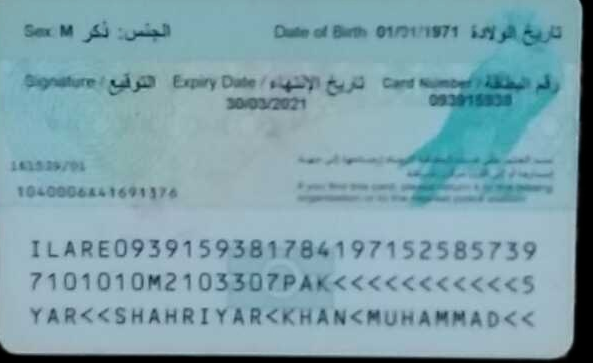

download https://paddleocr.bj.bcebos.com/PP-OCRv3/english/en_PP-OCRv3_det_infer.tar to /root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer/en_PP-OCRv3_det_infer.tar


100%|██████████| 4.00M/4.00M [00:06<00:00, 608kiB/s] 


download https://paddleocr.bj.bcebos.com/PP-OCRv3/english/en_PP-OCRv3_rec_infer.tar to /root/.paddleocr/whl/rec/en/en_PP-OCRv3_rec_infer/en_PP-OCRv3_rec_infer.tar


100%|██████████| 9.96M/9.96M [00:23<00:00, 427kiB/s] 


download https://paddleocr.bj.bcebos.com/dygraph_v2.0/ch/ch_ppocr_mobile_v2.0_cls_infer.tar to /root/.paddleocr/whl/cls/ch_ppocr_mobile_v2.0_cls_infer/ch_ppocr_mobile_v2.0_cls_infer.tar


100%|██████████| 2.19M/2.19M [00:05<00:00, 406kiB/s]

[2023/01/05 14:01:33] ppocr DEBUG: Namespace(alpha=1.0, benchmark=False, beta=1.0, cls_batch_num=6, cls_image_shape='3, 48, 192', cls_model_dir='/root/.paddleocr/whl/cls/ch_ppocr_mobile_v2.0_cls_infer', cls_thresh=0.9, cpu_threads=10, crop_res_save_dir='./output', det=True, det_algorithm='DB', det_box_type='quad', det_db_box_thresh=0.6, det_db_score_mode='fast', det_db_thresh=0.3, det_db_unclip_ratio=1.5, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_east_score_thresh=0.8, det_limit_side_len=960, det_limit_type='max', det_model_dir='/root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer', det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, det_pse_thresh=0, det_sast_nms_thresh=0.2, det_sast_score_thresh=0.5, draw_img_save_dir='./inference_results', drop_score=0.5, e2e_algorithm='PGNet', e2e_char_dict_path='./ppocr/utils/ic15_dict.txt', e2e_limit_side_len=768, e2e_limit_type='max', e2e_model_dir=None, e2e_pgnet_mode='fast', e2e_pgnet_score_thresh=0.5, e2e_pgnet_valid_set

[2023/01/05 14:01:34] ppocr DEBUG: dt_boxes num : 1, elapse : 0.06357192993164062
[2023/01/05 14:01:34] ppocr DEBUG: rec_res num  : 1, elapse : 0.3440897464752197
['ILARE0939159381784197152585739']
[2023/01/05 14:01:34] ppocr DEBUG: Namespace(alpha=1.0, benchmark=False, beta=1.0, cls_batch_num=6, cls_image_shape='3, 48, 192', cls_model_dir='/root/.paddleocr/whl/cls/ch_ppocr_mobile_v2.0_cls_infer', cls_thresh=0.9, cpu_threads=10, crop_res_save_dir='./output', det=True, det_algorithm='DB', det_box_type='quad', det_db_box_thresh=0.6, det_db_score_mode='fast', det_db_thresh=0.3, det_db_unclip_ratio=1.5, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_east_score_thresh=0.8, det_limit_side_len=960, det_limit_type='max', det_model_dir='/root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer', det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, det_pse_thresh=0, det_sast_nms_thresh=0.2, det_sast_score_thresh=0.5, draw_img_save_dir='./inference_results', drop_score=0.5, e2e_algorit

In [26]:
# model = getModel()
# if(image.split('.')[-1] != 'jpg'):
#   continue
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
INPUT_FILE = input_file
if validators.url(INPUT_FILE):
  url_response = urllib.request.urlopen(INPUT_FILE)
  arr = np.asarray(bytearray(url_response.read()), dtype=np.uint8)
  image = cv2.imdecode(arr, -1)
  cv2.imwrite('image.png', image)
  INPUT_FILE='image.png'
OUTPUT_MASK = '/content/output_mask.png'
OUTPUT_FILE = '/content/output_pred.png'
MODEL_FILE = '/content/gdrive/MyDrive/model_final.pt'
if not os.path.isfile(INPUT_FILE):
  print('Input image not found ', INPUT_FILE)
else:
  if not os.path.isfile(MODEL_FILE):
      print('Model not found ', MODEL_FILE)
  else:
      # print('Load model... ', MODEL_FILE)
      model = UNet(n_channels=1, n_classes=1)

      checkpoint = torch.load(pathlib.Path(MODEL_FILE), map_location=torch.device('cpu'))
      model.load_state_dict(checkpoint)
      model.to(device)
      model.eval()
      img, h, w = load_image(INPUT_FILE)
      output_image = predict_image(model, img)
      mask_image = cv2.resize(output_image, (w, h))
      cv2.imwrite(OUTPUT_MASK, mask_image)
      warped = extract_idcard(cv2.imread(INPUT_FILE), mask_image)
      cv2.imwrite('fig.jpg', warped)
      cv2_imshow(warped)
      mrz, mrz_img_file = extract_mrz_('fig.jpg')
      top, middle, bottom = split_image(mrz_img_file)
      out1 = read_mrz_top(top)
      out2 = read_mrz_middle(middle)
      out3 = read_mrz_bottom(bottom)

      print(out1)
      print(out2)
      print(out3)

### Testing for an entire folder

/content/gdrive/MyDrive/uae_cropped/ae930b32d632401790a5b1a08d8d3f6cefcc29bdfa494c22bae122932aad5f82.jpg


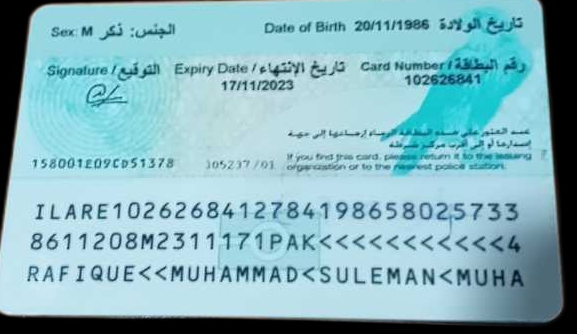

[2023/01/05 03:51:23] ppocr DEBUG: Namespace(alpha=1.0, benchmark=False, beta=1.0, cls_batch_num=6, cls_image_shape='3, 48, 192', cls_model_dir='/root/.paddleocr/whl/cls/ch_ppocr_mobile_v2.0_cls_infer', cls_thresh=0.9, cpu_threads=10, crop_res_save_dir='./output', det=True, det_algorithm='DB', det_box_type='quad', det_db_box_thresh=0.6, det_db_score_mode='fast', det_db_thresh=0.3, det_db_unclip_ratio=1.5, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_east_score_thresh=0.8, det_limit_side_len=960, det_limit_type='max', det_model_dir='/root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer', det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, det_pse_thresh=0, det_sast_nms_thresh=0.2, det_sast_score_thresh=0.5, draw_img_save_dir='./inference_results', drop_score=0.5, e2e_algorithm='PGNet', e2e_char_dict_path='./ppocr/utils/ic15_dict.txt', e2e_limit_side_len=768, e2e_limit_type='max', e2e_model_dir=None, e2e_pgnet_mode='fast', e2e_pgnet_score_thresh=0.5, e2e_pgnet_valid_set

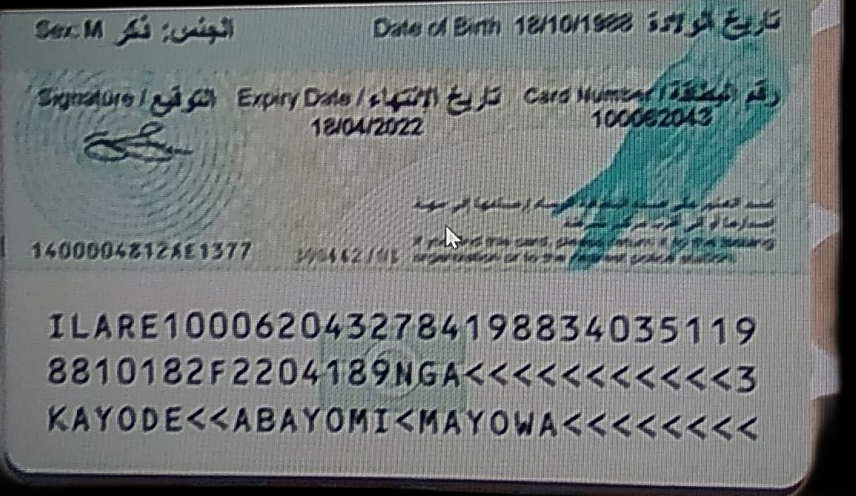

[2023/01/05 03:51:28] ppocr DEBUG: Namespace(alpha=1.0, benchmark=False, beta=1.0, cls_batch_num=6, cls_image_shape='3, 48, 192', cls_model_dir='/root/.paddleocr/whl/cls/ch_ppocr_mobile_v2.0_cls_infer', cls_thresh=0.9, cpu_threads=10, crop_res_save_dir='./output', det=True, det_algorithm='DB', det_box_type='quad', det_db_box_thresh=0.6, det_db_score_mode='fast', det_db_thresh=0.3, det_db_unclip_ratio=1.5, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_east_score_thresh=0.8, det_limit_side_len=960, det_limit_type='max', det_model_dir='/root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer', det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, det_pse_thresh=0, det_sast_nms_thresh=0.2, det_sast_score_thresh=0.5, draw_img_save_dir='./inference_results', drop_score=0.5, e2e_algorithm='PGNet', e2e_char_dict_path='./ppocr/utils/ic15_dict.txt', e2e_limit_side_len=768, e2e_limit_type='max', e2e_model_dir=None, e2e_pgnet_mode='fast', e2e_pgnet_score_thresh=0.5, e2e_pgnet_valid_set

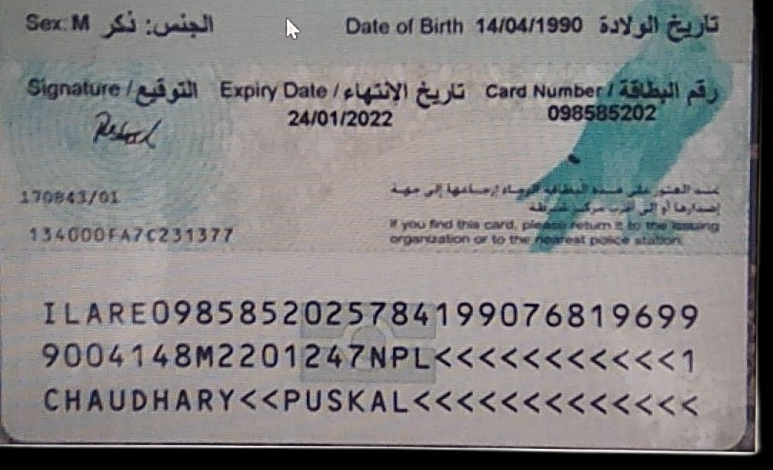

[2023/01/05 03:51:34] ppocr DEBUG: Namespace(alpha=1.0, benchmark=False, beta=1.0, cls_batch_num=6, cls_image_shape='3, 48, 192', cls_model_dir='/root/.paddleocr/whl/cls/ch_ppocr_mobile_v2.0_cls_infer', cls_thresh=0.9, cpu_threads=10, crop_res_save_dir='./output', det=True, det_algorithm='DB', det_box_type='quad', det_db_box_thresh=0.6, det_db_score_mode='fast', det_db_thresh=0.3, det_db_unclip_ratio=1.5, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_east_score_thresh=0.8, det_limit_side_len=960, det_limit_type='max', det_model_dir='/root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer', det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, det_pse_thresh=0, det_sast_nms_thresh=0.2, det_sast_score_thresh=0.5, draw_img_save_dir='./inference_results', drop_score=0.5, e2e_algorithm='PGNet', e2e_char_dict_path='./ppocr/utils/ic15_dict.txt', e2e_limit_side_len=768, e2e_limit_type='max', e2e_model_dir=None, e2e_pgnet_mode='fast', e2e_pgnet_score_thresh=0.5, e2e_pgnet_valid_set

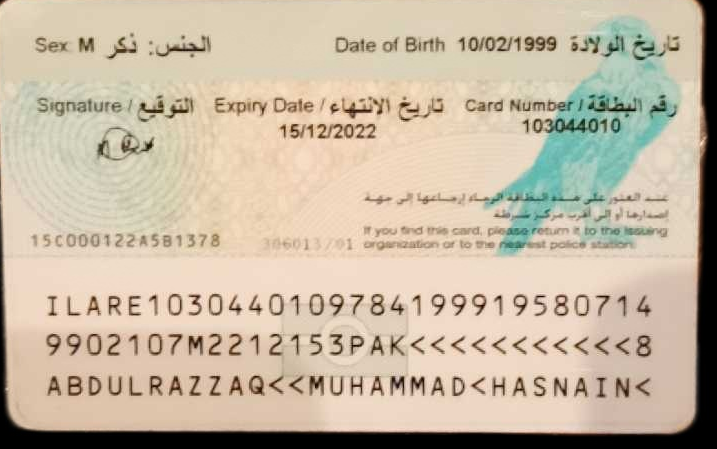

[2023/01/05 03:51:40] ppocr DEBUG: Namespace(alpha=1.0, benchmark=False, beta=1.0, cls_batch_num=6, cls_image_shape='3, 48, 192', cls_model_dir='/root/.paddleocr/whl/cls/ch_ppocr_mobile_v2.0_cls_infer', cls_thresh=0.9, cpu_threads=10, crop_res_save_dir='./output', det=True, det_algorithm='DB', det_box_type='quad', det_db_box_thresh=0.6, det_db_score_mode='fast', det_db_thresh=0.3, det_db_unclip_ratio=1.5, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_east_score_thresh=0.8, det_limit_side_len=960, det_limit_type='max', det_model_dir='/root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer', det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, det_pse_thresh=0, det_sast_nms_thresh=0.2, det_sast_score_thresh=0.5, draw_img_save_dir='./inference_results', drop_score=0.5, e2e_algorithm='PGNet', e2e_char_dict_path='./ppocr/utils/ic15_dict.txt', e2e_limit_side_len=768, e2e_limit_type='max', e2e_model_dir=None, e2e_pgnet_mode='fast', e2e_pgnet_score_thresh=0.5, e2e_pgnet_valid_set

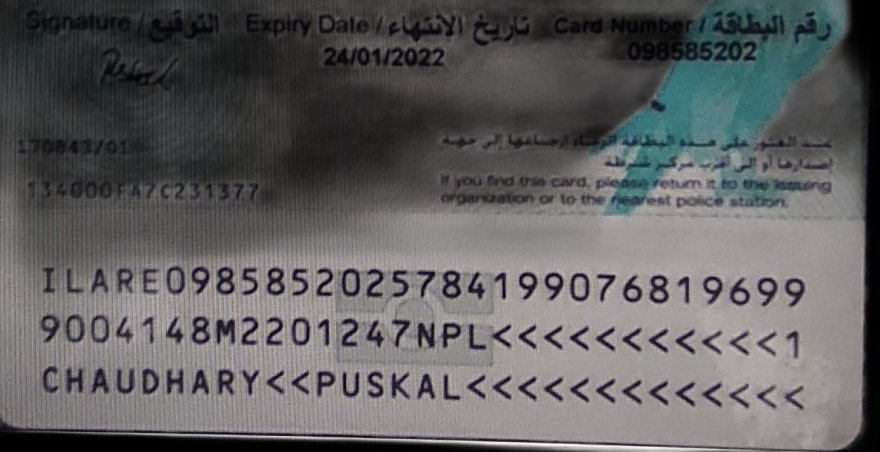

[2023/01/05 03:51:47] ppocr DEBUG: Namespace(alpha=1.0, benchmark=False, beta=1.0, cls_batch_num=6, cls_image_shape='3, 48, 192', cls_model_dir='/root/.paddleocr/whl/cls/ch_ppocr_mobile_v2.0_cls_infer', cls_thresh=0.9, cpu_threads=10, crop_res_save_dir='./output', det=True, det_algorithm='DB', det_box_type='quad', det_db_box_thresh=0.6, det_db_score_mode='fast', det_db_thresh=0.3, det_db_unclip_ratio=1.5, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_east_score_thresh=0.8, det_limit_side_len=960, det_limit_type='max', det_model_dir='/root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer', det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, det_pse_thresh=0, det_sast_nms_thresh=0.2, det_sast_score_thresh=0.5, draw_img_save_dir='./inference_results', drop_score=0.5, e2e_algorithm='PGNet', e2e_char_dict_path='./ppocr/utils/ic15_dict.txt', e2e_limit_side_len=768, e2e_limit_type='max', e2e_model_dir=None, e2e_pgnet_mode='fast', e2e_pgnet_score_thresh=0.5, e2e_pgnet_valid_set

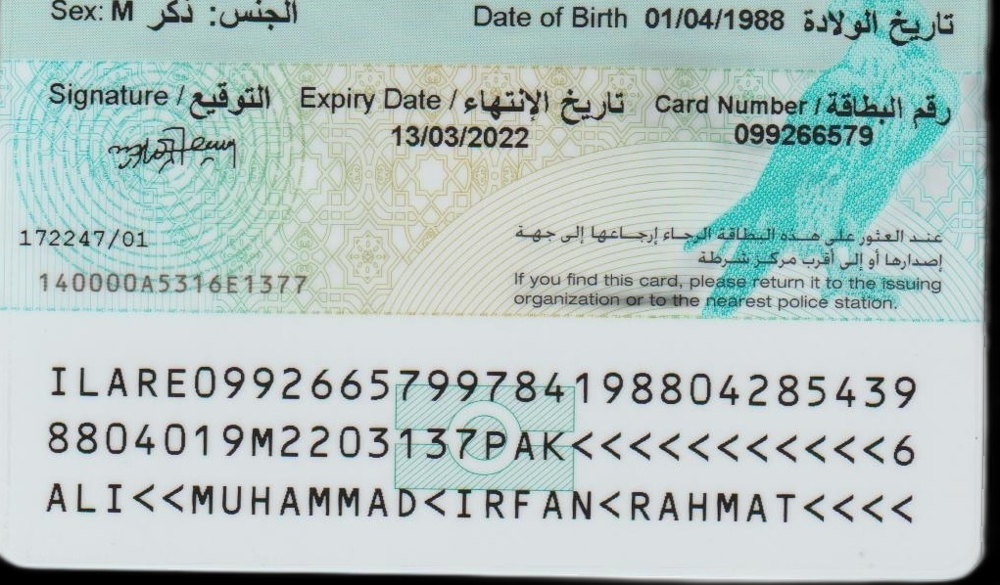

[2023/01/05 03:51:53] ppocr DEBUG: Namespace(alpha=1.0, benchmark=False, beta=1.0, cls_batch_num=6, cls_image_shape='3, 48, 192', cls_model_dir='/root/.paddleocr/whl/cls/ch_ppocr_mobile_v2.0_cls_infer', cls_thresh=0.9, cpu_threads=10, crop_res_save_dir='./output', det=True, det_algorithm='DB', det_box_type='quad', det_db_box_thresh=0.6, det_db_score_mode='fast', det_db_thresh=0.3, det_db_unclip_ratio=1.5, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_east_score_thresh=0.8, det_limit_side_len=960, det_limit_type='max', det_model_dir='/root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer', det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, det_pse_thresh=0, det_sast_nms_thresh=0.2, det_sast_score_thresh=0.5, draw_img_save_dir='./inference_results', drop_score=0.5, e2e_algorithm='PGNet', e2e_char_dict_path='./ppocr/utils/ic15_dict.txt', e2e_limit_side_len=768, e2e_limit_type='max', e2e_model_dir=None, e2e_pgnet_mode='fast', e2e_pgnet_score_thresh=0.5, e2e_pgnet_valid_set

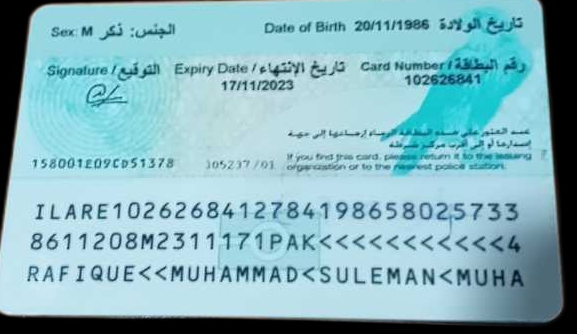

[2023/01/05 03:51:59] ppocr DEBUG: Namespace(alpha=1.0, benchmark=False, beta=1.0, cls_batch_num=6, cls_image_shape='3, 48, 192', cls_model_dir='/root/.paddleocr/whl/cls/ch_ppocr_mobile_v2.0_cls_infer', cls_thresh=0.9, cpu_threads=10, crop_res_save_dir='./output', det=True, det_algorithm='DB', det_box_type='quad', det_db_box_thresh=0.6, det_db_score_mode='fast', det_db_thresh=0.3, det_db_unclip_ratio=1.5, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_east_score_thresh=0.8, det_limit_side_len=960, det_limit_type='max', det_model_dir='/root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer', det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, det_pse_thresh=0, det_sast_nms_thresh=0.2, det_sast_score_thresh=0.5, draw_img_save_dir='./inference_results', drop_score=0.5, e2e_algorithm='PGNet', e2e_char_dict_path='./ppocr/utils/ic15_dict.txt', e2e_limit_side_len=768, e2e_limit_type='max', e2e_model_dir=None, e2e_pgnet_mode='fast', e2e_pgnet_score_thresh=0.5, e2e_pgnet_valid_set

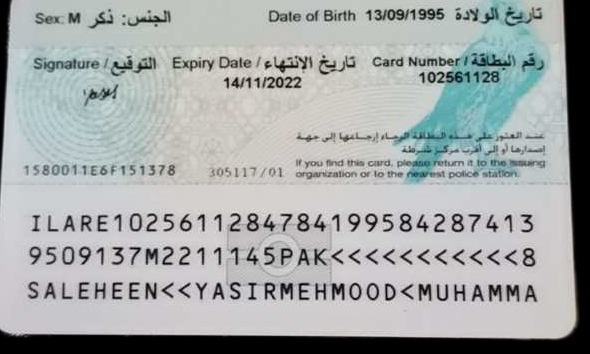

[2023/01/05 03:52:05] ppocr DEBUG: Namespace(alpha=1.0, benchmark=False, beta=1.0, cls_batch_num=6, cls_image_shape='3, 48, 192', cls_model_dir='/root/.paddleocr/whl/cls/ch_ppocr_mobile_v2.0_cls_infer', cls_thresh=0.9, cpu_threads=10, crop_res_save_dir='./output', det=True, det_algorithm='DB', det_box_type='quad', det_db_box_thresh=0.6, det_db_score_mode='fast', det_db_thresh=0.3, det_db_unclip_ratio=1.5, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_east_score_thresh=0.8, det_limit_side_len=960, det_limit_type='max', det_model_dir='/root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer', det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, det_pse_thresh=0, det_sast_nms_thresh=0.2, det_sast_score_thresh=0.5, draw_img_save_dir='./inference_results', drop_score=0.5, e2e_algorithm='PGNet', e2e_char_dict_path='./ppocr/utils/ic15_dict.txt', e2e_limit_side_len=768, e2e_limit_type='max', e2e_model_dir=None, e2e_pgnet_mode='fast', e2e_pgnet_score_thresh=0.5, e2e_pgnet_valid_set

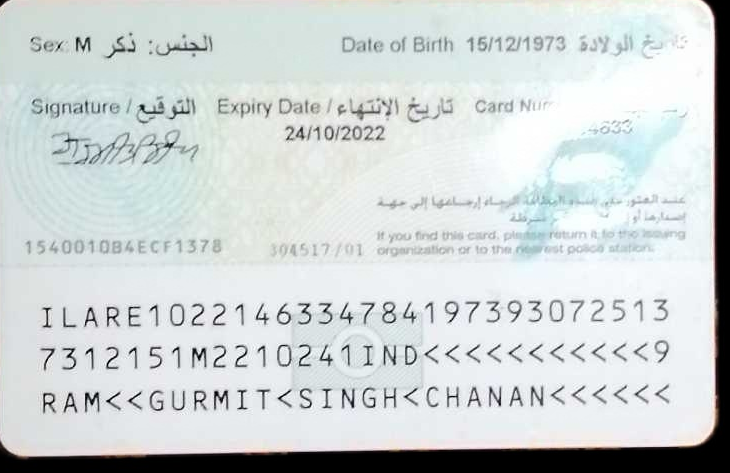

[2023/01/05 03:52:11] ppocr DEBUG: Namespace(alpha=1.0, benchmark=False, beta=1.0, cls_batch_num=6, cls_image_shape='3, 48, 192', cls_model_dir='/root/.paddleocr/whl/cls/ch_ppocr_mobile_v2.0_cls_infer', cls_thresh=0.9, cpu_threads=10, crop_res_save_dir='./output', det=True, det_algorithm='DB', det_box_type='quad', det_db_box_thresh=0.6, det_db_score_mode='fast', det_db_thresh=0.3, det_db_unclip_ratio=1.5, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_east_score_thresh=0.8, det_limit_side_len=960, det_limit_type='max', det_model_dir='/root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer', det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, det_pse_thresh=0, det_sast_nms_thresh=0.2, det_sast_score_thresh=0.5, draw_img_save_dir='./inference_results', drop_score=0.5, e2e_algorithm='PGNet', e2e_char_dict_path='./ppocr/utils/ic15_dict.txt', e2e_limit_side_len=768, e2e_limit_type='max', e2e_model_dir=None, e2e_pgnet_mode='fast', e2e_pgnet_score_thresh=0.5, e2e_pgnet_valid_set

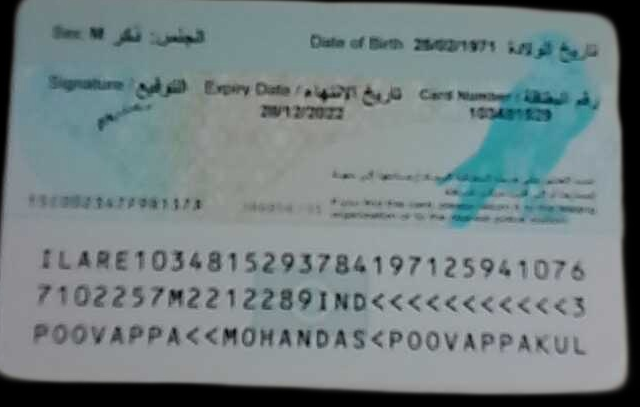

[2023/01/05 03:52:18] ppocr DEBUG: Namespace(alpha=1.0, benchmark=False, beta=1.0, cls_batch_num=6, cls_image_shape='3, 48, 192', cls_model_dir='/root/.paddleocr/whl/cls/ch_ppocr_mobile_v2.0_cls_infer', cls_thresh=0.9, cpu_threads=10, crop_res_save_dir='./output', det=True, det_algorithm='DB', det_box_type='quad', det_db_box_thresh=0.6, det_db_score_mode='fast', det_db_thresh=0.3, det_db_unclip_ratio=1.5, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_east_score_thresh=0.8, det_limit_side_len=960, det_limit_type='max', det_model_dir='/root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer', det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, det_pse_thresh=0, det_sast_nms_thresh=0.2, det_sast_score_thresh=0.5, draw_img_save_dir='./inference_results', drop_score=0.5, e2e_algorithm='PGNet', e2e_char_dict_path='./ppocr/utils/ic15_dict.txt', e2e_limit_side_len=768, e2e_limit_type='max', e2e_model_dir=None, e2e_pgnet_mode='fast', e2e_pgnet_score_thresh=0.5, e2e_pgnet_valid_set

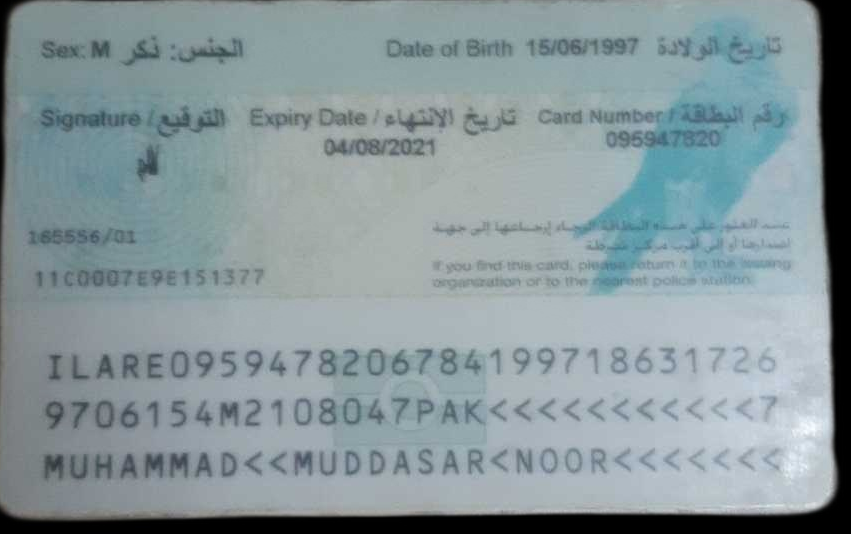

[2023/01/05 03:52:25] ppocr DEBUG: Namespace(alpha=1.0, benchmark=False, beta=1.0, cls_batch_num=6, cls_image_shape='3, 48, 192', cls_model_dir='/root/.paddleocr/whl/cls/ch_ppocr_mobile_v2.0_cls_infer', cls_thresh=0.9, cpu_threads=10, crop_res_save_dir='./output', det=True, det_algorithm='DB', det_box_type='quad', det_db_box_thresh=0.6, det_db_score_mode='fast', det_db_thresh=0.3, det_db_unclip_ratio=1.5, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_east_score_thresh=0.8, det_limit_side_len=960, det_limit_type='max', det_model_dir='/root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer', det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, det_pse_thresh=0, det_sast_nms_thresh=0.2, det_sast_score_thresh=0.5, draw_img_save_dir='./inference_results', drop_score=0.5, e2e_algorithm='PGNet', e2e_char_dict_path='./ppocr/utils/ic15_dict.txt', e2e_limit_side_len=768, e2e_limit_type='max', e2e_model_dir=None, e2e_pgnet_mode='fast', e2e_pgnet_score_thresh=0.5, e2e_pgnet_valid_set

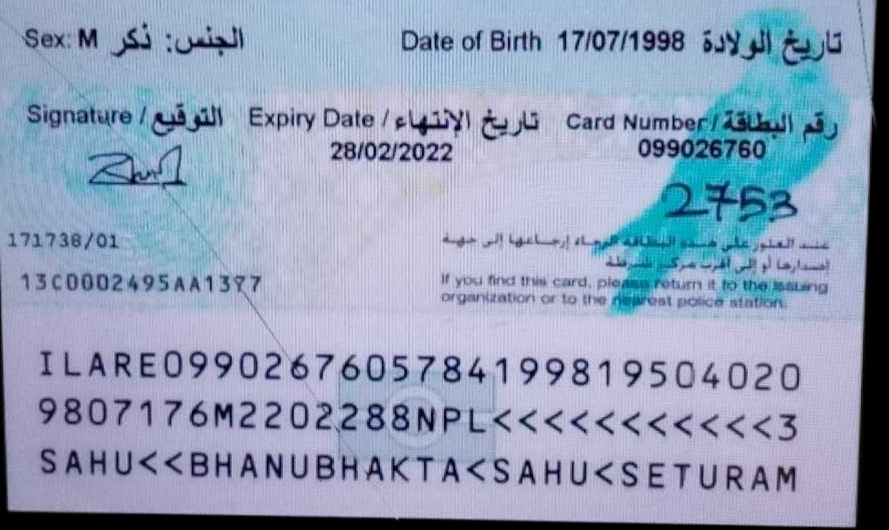

[2023/01/05 03:52:33] ppocr DEBUG: Namespace(alpha=1.0, benchmark=False, beta=1.0, cls_batch_num=6, cls_image_shape='3, 48, 192', cls_model_dir='/root/.paddleocr/whl/cls/ch_ppocr_mobile_v2.0_cls_infer', cls_thresh=0.9, cpu_threads=10, crop_res_save_dir='./output', det=True, det_algorithm='DB', det_box_type='quad', det_db_box_thresh=0.6, det_db_score_mode='fast', det_db_thresh=0.3, det_db_unclip_ratio=1.5, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_east_score_thresh=0.8, det_limit_side_len=960, det_limit_type='max', det_model_dir='/root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer', det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, det_pse_thresh=0, det_sast_nms_thresh=0.2, det_sast_score_thresh=0.5, draw_img_save_dir='./inference_results', drop_score=0.5, e2e_algorithm='PGNet', e2e_char_dict_path='./ppocr/utils/ic15_dict.txt', e2e_limit_side_len=768, e2e_limit_type='max', e2e_model_dir=None, e2e_pgnet_mode='fast', e2e_pgnet_score_thresh=0.5, e2e_pgnet_valid_set

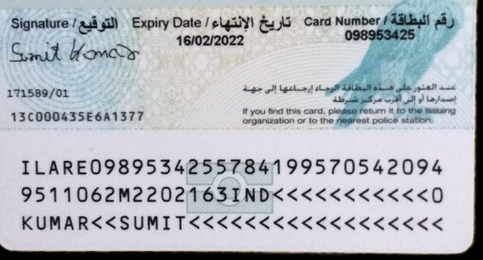

[2023/01/05 03:52:40] ppocr DEBUG: Namespace(alpha=1.0, benchmark=False, beta=1.0, cls_batch_num=6, cls_image_shape='3, 48, 192', cls_model_dir='/root/.paddleocr/whl/cls/ch_ppocr_mobile_v2.0_cls_infer', cls_thresh=0.9, cpu_threads=10, crop_res_save_dir='./output', det=True, det_algorithm='DB', det_box_type='quad', det_db_box_thresh=0.6, det_db_score_mode='fast', det_db_thresh=0.3, det_db_unclip_ratio=1.5, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_east_score_thresh=0.8, det_limit_side_len=960, det_limit_type='max', det_model_dir='/root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer', det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, det_pse_thresh=0, det_sast_nms_thresh=0.2, det_sast_score_thresh=0.5, draw_img_save_dir='./inference_results', drop_score=0.5, e2e_algorithm='PGNet', e2e_char_dict_path='./ppocr/utils/ic15_dict.txt', e2e_limit_side_len=768, e2e_limit_type='max', e2e_model_dir=None, e2e_pgnet_mode='fast', e2e_pgnet_score_thresh=0.5, e2e_pgnet_valid_set

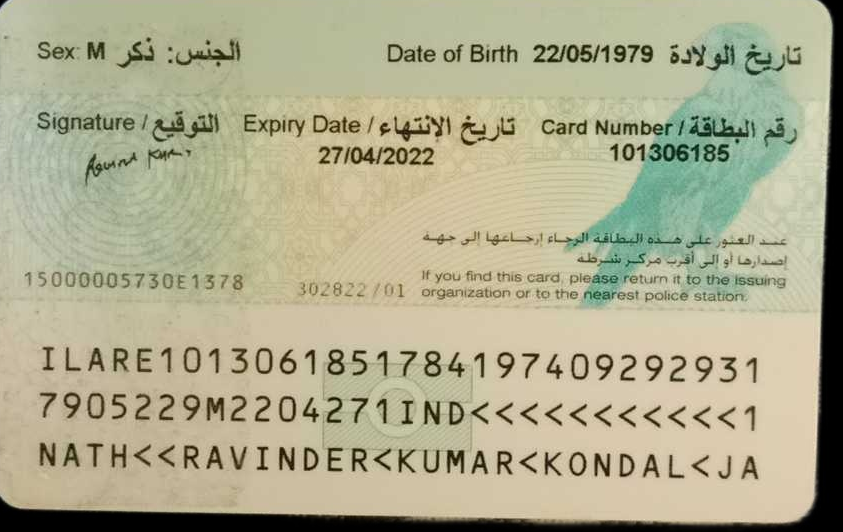

[2023/01/05 03:52:46] ppocr DEBUG: Namespace(alpha=1.0, benchmark=False, beta=1.0, cls_batch_num=6, cls_image_shape='3, 48, 192', cls_model_dir='/root/.paddleocr/whl/cls/ch_ppocr_mobile_v2.0_cls_infer', cls_thresh=0.9, cpu_threads=10, crop_res_save_dir='./output', det=True, det_algorithm='DB', det_box_type='quad', det_db_box_thresh=0.6, det_db_score_mode='fast', det_db_thresh=0.3, det_db_unclip_ratio=1.5, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_east_score_thresh=0.8, det_limit_side_len=960, det_limit_type='max', det_model_dir='/root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer', det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, det_pse_thresh=0, det_sast_nms_thresh=0.2, det_sast_score_thresh=0.5, draw_img_save_dir='./inference_results', drop_score=0.5, e2e_algorithm='PGNet', e2e_char_dict_path='./ppocr/utils/ic15_dict.txt', e2e_limit_side_len=768, e2e_limit_type='max', e2e_model_dir=None, e2e_pgnet_mode='fast', e2e_pgnet_score_thresh=0.5, e2e_pgnet_valid_set

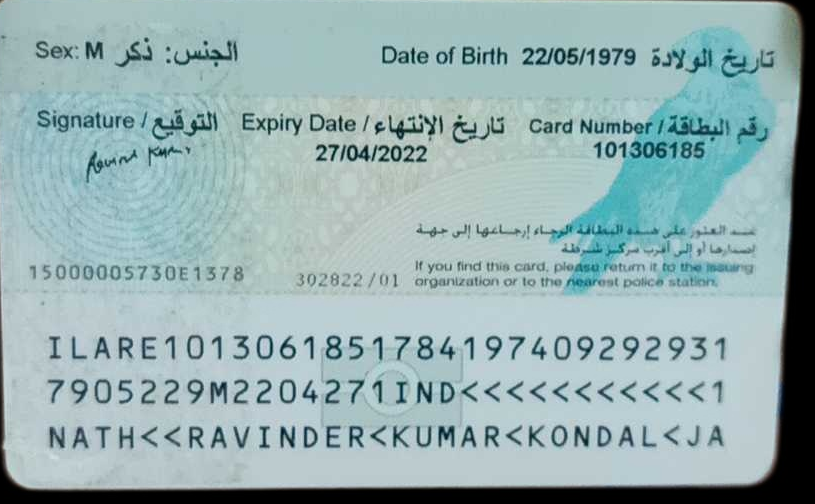

[2023/01/05 03:52:52] ppocr DEBUG: Namespace(alpha=1.0, benchmark=False, beta=1.0, cls_batch_num=6, cls_image_shape='3, 48, 192', cls_model_dir='/root/.paddleocr/whl/cls/ch_ppocr_mobile_v2.0_cls_infer', cls_thresh=0.9, cpu_threads=10, crop_res_save_dir='./output', det=True, det_algorithm='DB', det_box_type='quad', det_db_box_thresh=0.6, det_db_score_mode='fast', det_db_thresh=0.3, det_db_unclip_ratio=1.5, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_east_score_thresh=0.8, det_limit_side_len=960, det_limit_type='max', det_model_dir='/root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer', det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, det_pse_thresh=0, det_sast_nms_thresh=0.2, det_sast_score_thresh=0.5, draw_img_save_dir='./inference_results', drop_score=0.5, e2e_algorithm='PGNet', e2e_char_dict_path='./ppocr/utils/ic15_dict.txt', e2e_limit_side_len=768, e2e_limit_type='max', e2e_model_dir=None, e2e_pgnet_mode='fast', e2e_pgnet_score_thresh=0.5, e2e_pgnet_valid_set

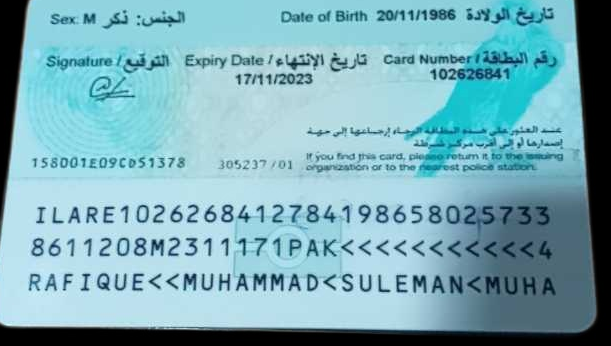

[2023/01/05 03:52:59] ppocr DEBUG: Namespace(alpha=1.0, benchmark=False, beta=1.0, cls_batch_num=6, cls_image_shape='3, 48, 192', cls_model_dir='/root/.paddleocr/whl/cls/ch_ppocr_mobile_v2.0_cls_infer', cls_thresh=0.9, cpu_threads=10, crop_res_save_dir='./output', det=True, det_algorithm='DB', det_box_type='quad', det_db_box_thresh=0.6, det_db_score_mode='fast', det_db_thresh=0.3, det_db_unclip_ratio=1.5, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_east_score_thresh=0.8, det_limit_side_len=960, det_limit_type='max', det_model_dir='/root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer', det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, det_pse_thresh=0, det_sast_nms_thresh=0.2, det_sast_score_thresh=0.5, draw_img_save_dir='./inference_results', drop_score=0.5, e2e_algorithm='PGNet', e2e_char_dict_path='./ppocr/utils/ic15_dict.txt', e2e_limit_side_len=768, e2e_limit_type='max', e2e_model_dir=None, e2e_pgnet_mode='fast', e2e_pgnet_score_thresh=0.5, e2e_pgnet_valid_set

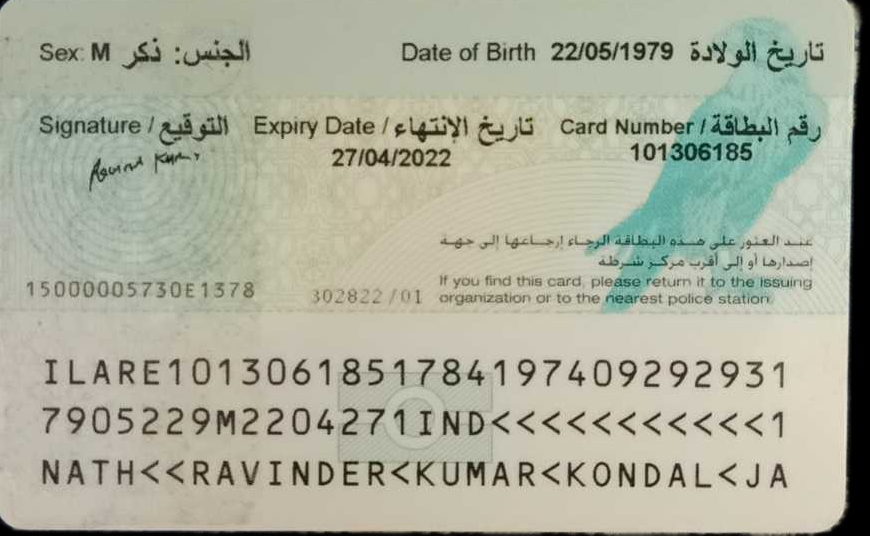

[2023/01/05 03:53:05] ppocr DEBUG: Namespace(alpha=1.0, benchmark=False, beta=1.0, cls_batch_num=6, cls_image_shape='3, 48, 192', cls_model_dir='/root/.paddleocr/whl/cls/ch_ppocr_mobile_v2.0_cls_infer', cls_thresh=0.9, cpu_threads=10, crop_res_save_dir='./output', det=True, det_algorithm='DB', det_box_type='quad', det_db_box_thresh=0.6, det_db_score_mode='fast', det_db_thresh=0.3, det_db_unclip_ratio=1.5, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_east_score_thresh=0.8, det_limit_side_len=960, det_limit_type='max', det_model_dir='/root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer', det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, det_pse_thresh=0, det_sast_nms_thresh=0.2, det_sast_score_thresh=0.5, draw_img_save_dir='./inference_results', drop_score=0.5, e2e_algorithm='PGNet', e2e_char_dict_path='./ppocr/utils/ic15_dict.txt', e2e_limit_side_len=768, e2e_limit_type='max', e2e_model_dir=None, e2e_pgnet_mode='fast', e2e_pgnet_score_thresh=0.5, e2e_pgnet_valid_set

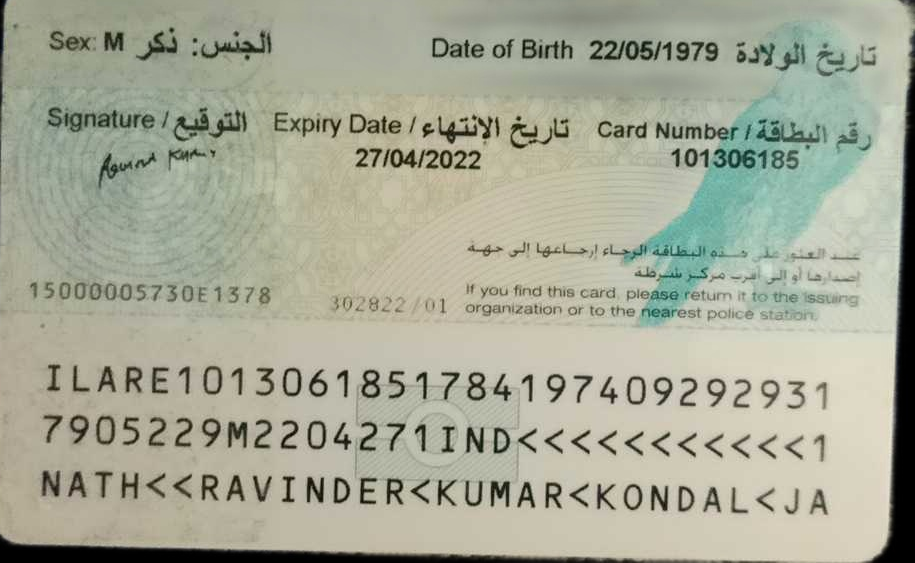

[2023/01/05 03:53:11] ppocr DEBUG: Namespace(alpha=1.0, benchmark=False, beta=1.0, cls_batch_num=6, cls_image_shape='3, 48, 192', cls_model_dir='/root/.paddleocr/whl/cls/ch_ppocr_mobile_v2.0_cls_infer', cls_thresh=0.9, cpu_threads=10, crop_res_save_dir='./output', det=True, det_algorithm='DB', det_box_type='quad', det_db_box_thresh=0.6, det_db_score_mode='fast', det_db_thresh=0.3, det_db_unclip_ratio=1.5, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_east_score_thresh=0.8, det_limit_side_len=960, det_limit_type='max', det_model_dir='/root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer', det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, det_pse_thresh=0, det_sast_nms_thresh=0.2, det_sast_score_thresh=0.5, draw_img_save_dir='./inference_results', drop_score=0.5, e2e_algorithm='PGNet', e2e_char_dict_path='./ppocr/utils/ic15_dict.txt', e2e_limit_side_len=768, e2e_limit_type='max', e2e_model_dir=None, e2e_pgnet_mode='fast', e2e_pgnet_score_thresh=0.5, e2e_pgnet_valid_set

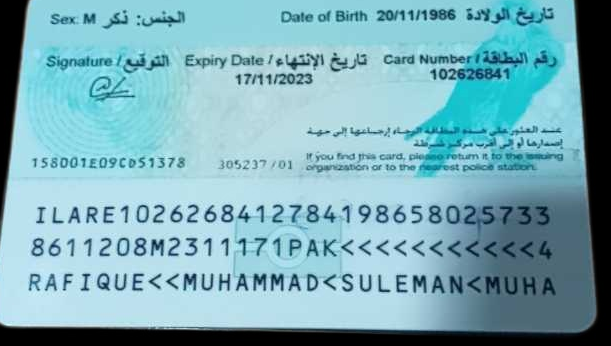

[2023/01/05 03:53:18] ppocr DEBUG: Namespace(alpha=1.0, benchmark=False, beta=1.0, cls_batch_num=6, cls_image_shape='3, 48, 192', cls_model_dir='/root/.paddleocr/whl/cls/ch_ppocr_mobile_v2.0_cls_infer', cls_thresh=0.9, cpu_threads=10, crop_res_save_dir='./output', det=True, det_algorithm='DB', det_box_type='quad', det_db_box_thresh=0.6, det_db_score_mode='fast', det_db_thresh=0.3, det_db_unclip_ratio=1.5, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_east_score_thresh=0.8, det_limit_side_len=960, det_limit_type='max', det_model_dir='/root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer', det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, det_pse_thresh=0, det_sast_nms_thresh=0.2, det_sast_score_thresh=0.5, draw_img_save_dir='./inference_results', drop_score=0.5, e2e_algorithm='PGNet', e2e_char_dict_path='./ppocr/utils/ic15_dict.txt', e2e_limit_side_len=768, e2e_limit_type='max', e2e_model_dir=None, e2e_pgnet_mode='fast', e2e_pgnet_score_thresh=0.5, e2e_pgnet_valid_set

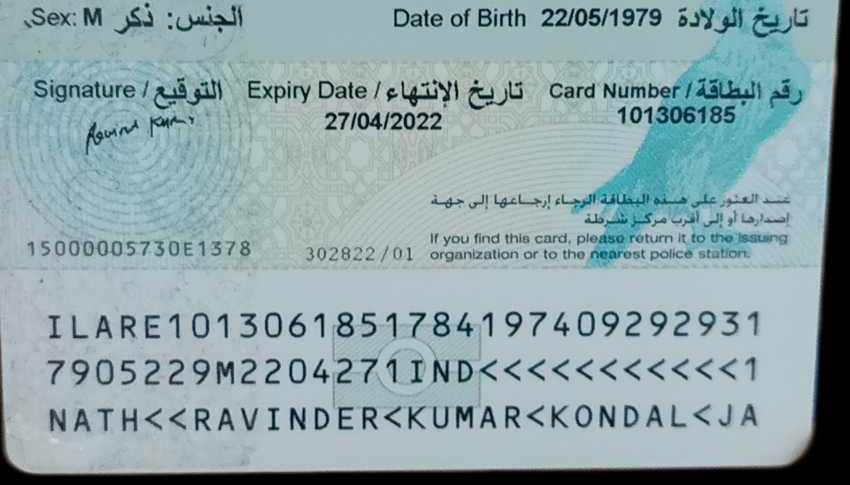

[2023/01/05 03:53:24] ppocr DEBUG: Namespace(alpha=1.0, benchmark=False, beta=1.0, cls_batch_num=6, cls_image_shape='3, 48, 192', cls_model_dir='/root/.paddleocr/whl/cls/ch_ppocr_mobile_v2.0_cls_infer', cls_thresh=0.9, cpu_threads=10, crop_res_save_dir='./output', det=True, det_algorithm='DB', det_box_type='quad', det_db_box_thresh=0.6, det_db_score_mode='fast', det_db_thresh=0.3, det_db_unclip_ratio=1.5, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_east_score_thresh=0.8, det_limit_side_len=960, det_limit_type='max', det_model_dir='/root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer', det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, det_pse_thresh=0, det_sast_nms_thresh=0.2, det_sast_score_thresh=0.5, draw_img_save_dir='./inference_results', drop_score=0.5, e2e_algorithm='PGNet', e2e_char_dict_path='./ppocr/utils/ic15_dict.txt', e2e_limit_side_len=768, e2e_limit_type='max', e2e_model_dir=None, e2e_pgnet_mode='fast', e2e_pgnet_score_thresh=0.5, e2e_pgnet_valid_set

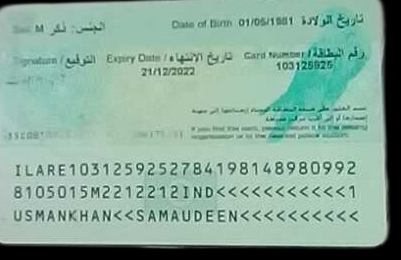

[2023/01/05 03:53:31] ppocr DEBUG: Namespace(alpha=1.0, benchmark=False, beta=1.0, cls_batch_num=6, cls_image_shape='3, 48, 192', cls_model_dir='/root/.paddleocr/whl/cls/ch_ppocr_mobile_v2.0_cls_infer', cls_thresh=0.9, cpu_threads=10, crop_res_save_dir='./output', det=True, det_algorithm='DB', det_box_type='quad', det_db_box_thresh=0.6, det_db_score_mode='fast', det_db_thresh=0.3, det_db_unclip_ratio=1.5, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_east_score_thresh=0.8, det_limit_side_len=960, det_limit_type='max', det_model_dir='/root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer', det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, det_pse_thresh=0, det_sast_nms_thresh=0.2, det_sast_score_thresh=0.5, draw_img_save_dir='./inference_results', drop_score=0.5, e2e_algorithm='PGNet', e2e_char_dict_path='./ppocr/utils/ic15_dict.txt', e2e_limit_side_len=768, e2e_limit_type='max', e2e_model_dir=None, e2e_pgnet_mode='fast', e2e_pgnet_score_thresh=0.5, e2e_pgnet_valid_set

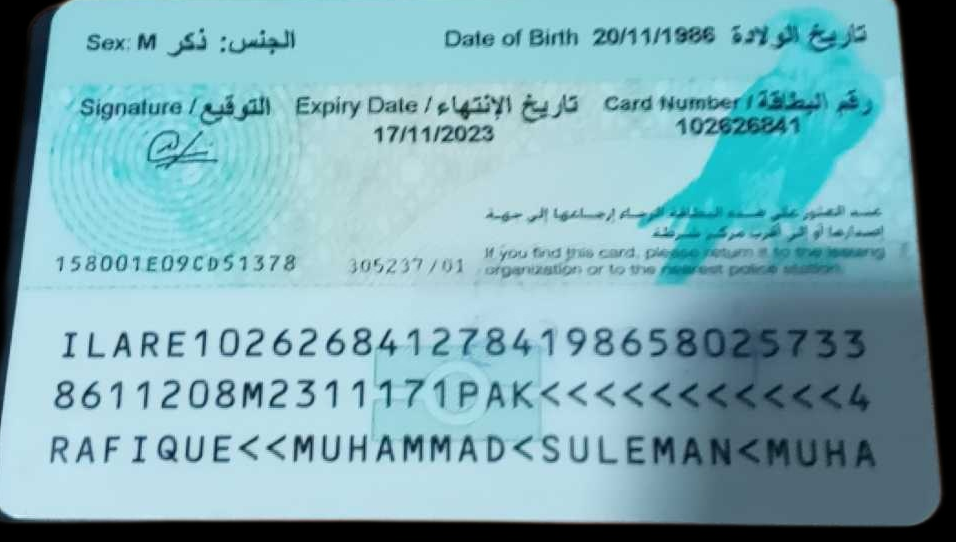

[2023/01/05 03:53:37] ppocr DEBUG: Namespace(alpha=1.0, benchmark=False, beta=1.0, cls_batch_num=6, cls_image_shape='3, 48, 192', cls_model_dir='/root/.paddleocr/whl/cls/ch_ppocr_mobile_v2.0_cls_infer', cls_thresh=0.9, cpu_threads=10, crop_res_save_dir='./output', det=True, det_algorithm='DB', det_box_type='quad', det_db_box_thresh=0.6, det_db_score_mode='fast', det_db_thresh=0.3, det_db_unclip_ratio=1.5, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_east_score_thresh=0.8, det_limit_side_len=960, det_limit_type='max', det_model_dir='/root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer', det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, det_pse_thresh=0, det_sast_nms_thresh=0.2, det_sast_score_thresh=0.5, draw_img_save_dir='./inference_results', drop_score=0.5, e2e_algorithm='PGNet', e2e_char_dict_path='./ppocr/utils/ic15_dict.txt', e2e_limit_side_len=768, e2e_limit_type='max', e2e_model_dir=None, e2e_pgnet_mode='fast', e2e_pgnet_score_thresh=0.5, e2e_pgnet_valid_set

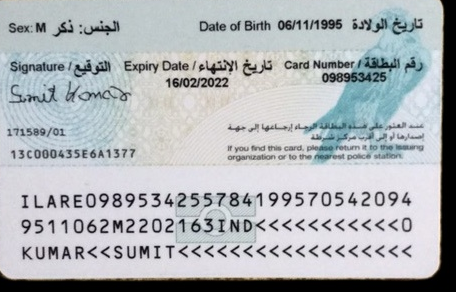

[2023/01/05 03:53:44] ppocr DEBUG: Namespace(alpha=1.0, benchmark=False, beta=1.0, cls_batch_num=6, cls_image_shape='3, 48, 192', cls_model_dir='/root/.paddleocr/whl/cls/ch_ppocr_mobile_v2.0_cls_infer', cls_thresh=0.9, cpu_threads=10, crop_res_save_dir='./output', det=True, det_algorithm='DB', det_box_type='quad', det_db_box_thresh=0.6, det_db_score_mode='fast', det_db_thresh=0.3, det_db_unclip_ratio=1.5, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_east_score_thresh=0.8, det_limit_side_len=960, det_limit_type='max', det_model_dir='/root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer', det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, det_pse_thresh=0, det_sast_nms_thresh=0.2, det_sast_score_thresh=0.5, draw_img_save_dir='./inference_results', drop_score=0.5, e2e_algorithm='PGNet', e2e_char_dict_path='./ppocr/utils/ic15_dict.txt', e2e_limit_side_len=768, e2e_limit_type='max', e2e_model_dir=None, e2e_pgnet_mode='fast', e2e_pgnet_score_thresh=0.5, e2e_pgnet_valid_set

error: ignored

In [ ]:
# @title Test Inference
import time
start = time.time()
for image in os.listdir("/content/gdrive/MyDrive/uae_cropped"):
  device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
  INPUT_FILE = "/content/gdrive/MyDrive/uae_cropped/" + image
  print(INPUT_FILE)
  if validators.url(INPUT_FILE):
    url_response = urllib.request.urlopen(INPUT_FILE)
    arr = np.asarray(bytearray(url_response.read()), dtype=np.uint8)
    image = cv2.imdecode(arr, -1)
    cv2.imwrite('image.png', image)
    INPUT_FILE='image.png'
  OUTPUT_MASK = '/content/output_mask.png'
  OUTPUT_FILE = '/content/output_pred.png'
  MODEL_FILE = '/content/gdrive/MyDrive/Copy of model_final.pt'
  if not os.path.isfile(INPUT_FILE):
    print('Input image not found ', INPUT_FILE)
  else:
    if not os.path.isfile(MODEL_FILE):
        print('Model not found ', MODEL_FILE)
    else:
        # print('Load model... ', MODEL_FILE)
        model = UNet(n_channels=1, n_classes=1)

        checkpoint = torch.load(pathlib.Path(MODEL_FILE), map_location=torch.device('cpu'))
        model.load_state_dict(checkpoint)
        model.to(device)
        model.eval()
        img, h, w = load_image(INPUT_FILE)
        output_image = predict_image(model, img)
        mask_image = cv2.resize(output_image, (w, h))
        cv2.imwrite(OUTPUT_MASK, mask_image)
        warped = extract_idcard(cv2.imread(INPUT_FILE), mask_image)
        cv2.imwrite('fig.jpg', warped)
        cv2_imshow(warped)
        mrz, mrz_img_file = extract_mrz_('fig.jpg')
        top, middle, bottom = split_image(mrz_img_file)
        # out = read_mrz(mrz, mrz_img_file)
        # print(out)
        read_mrz_top(top)
        read_mrz_middle(middle)
        read_mrz_bottom(bottom)

end = time.time()

print(f"Average FPS: {(end-start)/267} seconds.")

In [ ]:
def pipeline(IMAGE_FILE, model):
   cropped_figure = cropID(IMAGE_FILE, model) # crop image
   mrz, mrz_img_file = extract_mrz_(cropped_figure) # extract mrz
   if mrz is None:
     return -1, -1
   top, middle, bottom = split_image(mrz_img_file)
  # out = read_mrz(mrz, mrz_img_file)
  # print(out)
   out1 = read_mrz_top(top)
   out2 = read_mrz_middle(middle)
   out3 = read_mrz_bottom(bottom)

   if bool(out1) is False
   
   combined = {**out1, **out2, **out3}

   return combined
   

In [ ]:
mrzList = get_ppocr_model("/content/top.jpg")
mrzText = ' '.join(str(elem) for elem in mrzList)
#mrz postprocessing
mrzText = mrzText.replace (' ', '')
mrzText = mrzText.replace ('<<', '#')
mrzText = mrzText.replace ('<', '#')
mrzText=mrzText.replace ('\n', '#')

print(mrzText)
# print(mrzText)
x = filter(None,mrzText.split("#"))

mrz_list = list(x)

print(mrz_list)
# mrzdict = {
#     #"Image": image_file ,
#     "ID card": mrz_list[0][5:14],
# }
# print(mrzdict)

[2023/01/05 03:14:33] ppocr DEBUG: Namespace(alpha=1.0, benchmark=False, beta=1.0, cls_batch_num=6, cls_image_shape='3, 48, 192', cls_model_dir='/root/.paddleocr/whl/cls/ch_ppocr_mobile_v2.0_cls_infer', cls_thresh=0.9, cpu_threads=10, crop_res_save_dir='./output', det=True, det_algorithm='DB', det_box_type='quad', det_db_box_thresh=0.6, det_db_score_mode='fast', det_db_thresh=0.3, det_db_unclip_ratio=1.5, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_east_score_thresh=0.8, det_limit_side_len=960, det_limit_type='max', det_model_dir='/root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer', det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, det_pse_thresh=0, det_sast_nms_thresh=0.2, det_sast_score_thresh=0.5, draw_img_save_dir='./inference_results', drop_score=0.5, e2e_algorithm='PGNet', e2e_char_dict_path='./ppocr/utils/ic15_dict.txt', e2e_limit_side_len=768, e2e_limit_type='max', e2e_model_dir=None, e2e_pgnet_mode='fast', e2e_pgnet_score_thresh=0.5, e2e_pgnet_valid_set

In [ ]:
from tqdm import tqdm

model = getModel()
data_list = []
ppocr_data = pd.DataFrame()
image_files = os.listdir("/content/gdrive/MyDrive/uae_cropped/")
for index in tqdm(range(len(image_files))):
  result = pipeline("/content/gdrive/MyDrive/uae_cropped/"+ image_files[index], model)
  try:
    data = pd.DataFrame(result, index=[index])
  except:
    data = pd.DataFrame({ 
        "Image": image_files[index],
        "ID card": "",
        "Sex": "", 
        "DOB": "", 
        "DoE": "",
        "Country": "",
        "Surname": "",
        "Name": ""
    }, index=[index])
  data_list.append(data)

  0%|          | 0/268 [00:00<?, ?it/s]

[2023/01/04 17:14:29] ppocr DEBUG: Namespace(alpha=1.0, benchmark=False, beta=1.0, cls_batch_num=6, cls_image_shape='3, 48, 192', cls_model_dir='/root/.paddleocr/whl/cls/ch_ppocr_mobile_v2.0_cls_infer', cls_thresh=0.9, cpu_threads=10, crop_res_save_dir='./output', det=True, det_algorithm='DB', det_box_type='quad', det_db_box_thresh=0.6, det_db_score_mode='fast', det_db_thresh=0.3, det_db_unclip_ratio=1.5, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_east_score_thresh=0.8, det_limit_side_len=960, det_limit_type='max', det_model_dir='/root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer', det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, det_pse_thresh=0, det_sast_nms_thresh=0.2, det_sast_score_thresh=0.5, draw_img_save_dir='./inference_results', drop_score=0.5, e2e_algorithm='PGNet', e2e_char_dict_path='./ppocr/utils/ic15_dict.txt', e2e_limit_side_len=768, e2e_limit_type='max', e2e_model_dir=None, e2e_pgnet_mode='fast', e2e_pgnet_score_thresh=0.5, e2e_pgnet_valid_set

  0%|          | 0/268 [00:02<?, ?it/s]

[]


IndexError: ignored

In [ ]:
mrzList = get_ppocr_model("/content/temp.jpg")
mrzText = ' '.join(str(elem) for elem in mrzList)
#mrz postprocessing
mrzText = mrzText.replace (' ', '')

print(mrzText)
mrzText = mrzText.replace ('<<', '#')
mrzText = mrzText.replace ('<', '#')
#print(mrzText)
mrzText=mrzText.replace ('\n', '#')

# print(mrzText)
x = filter(None,mrzText.split("#"))

mrz_list = list(x)
print(mrz_list)

# mrz_list[0] = mrz_list[0].replace ('<', ' ')
# mrz_list[4] = mrz_list[4].replace ('<', ' ')
# mrz_list[3] = mrz_list[3].replace ("'", "")
# mrz_list[3] = mrz_list[3].replace ("<", " ")
# mrz_list[0] = mrz_list[0].replace (" ", "")
# mrz_list_0 = mrz_list[0]
# mrz_list[0] = mrz_list_0[1:len(mrz_list_0)-1]
# mrz_list_1=mrz_list[1]

# mrzdict = {
#     #"Image": image_file ,
#     "DOB": mrz_list_1[:6], 
#     "Sex": mrz_list_1[7], 
#     "DoE": mrz_list_1[8:14],
#     "Country": mrz_list_1[15:18],
#     "ID card": mrz_list[0][4:13],
#     "Surname": mrz_list[3],
#     "Name": mrz_list[4]
# }
# # except IndexError:
# # #   return None
# print(mrzdict)
# # return mrzdict

[2023/01/04 22:22:46] ppocr DEBUG: Namespace(alpha=1.0, benchmark=False, beta=1.0, cls_batch_num=6, cls_image_shape='3, 48, 192', cls_model_dir='/root/.paddleocr/whl/cls/ch_ppocr_mobile_v2.0_cls_infer', cls_thresh=0.9, cpu_threads=10, crop_res_save_dir='./output', det=True, det_algorithm='DB', det_box_type='quad', det_db_box_thresh=0.6, det_db_score_mode='fast', det_db_thresh=0.3, det_db_unclip_ratio=1.5, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_east_score_thresh=0.8, det_limit_side_len=960, det_limit_type='max', det_model_dir='/root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer', det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, det_pse_thresh=0, det_sast_nms_thresh=0.2, det_sast_score_thresh=0.5, draw_img_save_dir='./inference_results', drop_score=0.5, e2e_algorithm='PGNet', e2e_char_dict_path='./ppocr/utils/ic15_dict.txt', e2e_limit_side_len=768, e2e_limit_type='max', e2e_model_dir=None, e2e_pgnet_mode='fast', e2e_pgnet_score_thresh=0.5, e2e_pgnet_valid_set

In [ ]:
mrzList = get_ppocr_model("/content/top.jpg")
mrzText = ' '.join(str(elem) for elem in mrzList)
#mrz postprocessing
mrzText = mrzText.replace (' ', '')

print(mrzText)
mrzText = mrzText.replace ('<<', '#')
mrzText = mrzText.replace ('<', '#')
#print(mrzText)
mrzText=mrzText.replace ('\n', '#')

# print(mrzText)
x = filter(None,mrzText.split("#"))

mrz_list = list(x)
print(mrz_list)

mrzdict = {
    #"Image": image_file ,
    "ID card": mrz_list[0][5:14],
}

print(mrzdict)



[2023/01/04 22:23:05] ppocr DEBUG: Namespace(alpha=1.0, benchmark=False, beta=1.0, cls_batch_num=6, cls_image_shape='3, 48, 192', cls_model_dir='/root/.paddleocr/whl/cls/ch_ppocr_mobile_v2.0_cls_infer', cls_thresh=0.9, cpu_threads=10, crop_res_save_dir='./output', det=True, det_algorithm='DB', det_box_type='quad', det_db_box_thresh=0.6, det_db_score_mode='fast', det_db_thresh=0.3, det_db_unclip_ratio=1.5, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_east_score_thresh=0.8, det_limit_side_len=960, det_limit_type='max', det_model_dir='/root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer', det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, det_pse_thresh=0, det_sast_nms_thresh=0.2, det_sast_score_thresh=0.5, draw_img_save_dir='./inference_results', drop_score=0.5, e2e_algorithm='PGNet', e2e_char_dict_path='./ppocr/utils/ic15_dict.txt', e2e_limit_side_len=768, e2e_limit_type='max', e2e_model_dir=None, e2e_pgnet_mode='fast', e2e_pgnet_score_thresh=0.5, e2e_pgnet_valid_set